# XGBoost eXplainable AI

In [1]:
import shap
import pandas as pd
from src.models import retrieve_fit_model as rfm

## Retrieving latest most accurate XGBoost fit model

In [2]:
fit_xgb_model = rfm.get_fit_mlflow_model('xgb')

## Calculating Shapley values for fit XGBoost model

In [3]:
def get_fit_model_shapley_values_and_explainer(fit_xgb_model):
  """Return a tuple with a list containing computed Shapley values from fit XGBoost model
  and the obtained TreeExplainer.

  Keyword arguments:
  fit_xgb_model -- Fitted XGBoost model
  """
  explainer = shap.TreeExplainer(fit_xgb_model)
  data_for_prediction = pd.read_csv('../../data/processed/processed_application_test.csv')
  shap_values = explainer.shap_values(data_for_prediction)
  return shap_values, explainer

In [4]:
shap_values, explainer = get_fit_model_shapley_values_and_explainer(fit_xgb_model)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


## Showing explainer base value

In [5]:
explainer.expected_value

-2.6669068

In [6]:
shap_values.shape

(10468, 236)

## Choosing line index to get explanations from

In [7]:
line_index = 10

## Extracting test dataset line from index

In [8]:
test = pd.read_csv('../../data/processed/processed_application_test.csv')
line = test.iloc[line_index]

## Vizualizing explanations for a single line in test dataset

In [9]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[line_index], line)

## Vizualizing explanations for all lines in test dataset at once (subsample at 1000 lines)

In [10]:
shap.force_plot(explainer.expected_value, shap_values[:1000], test.sample(1000))

## Vizualizing a summary plot for each class on the whole dataset (subsample at 1000 lines)

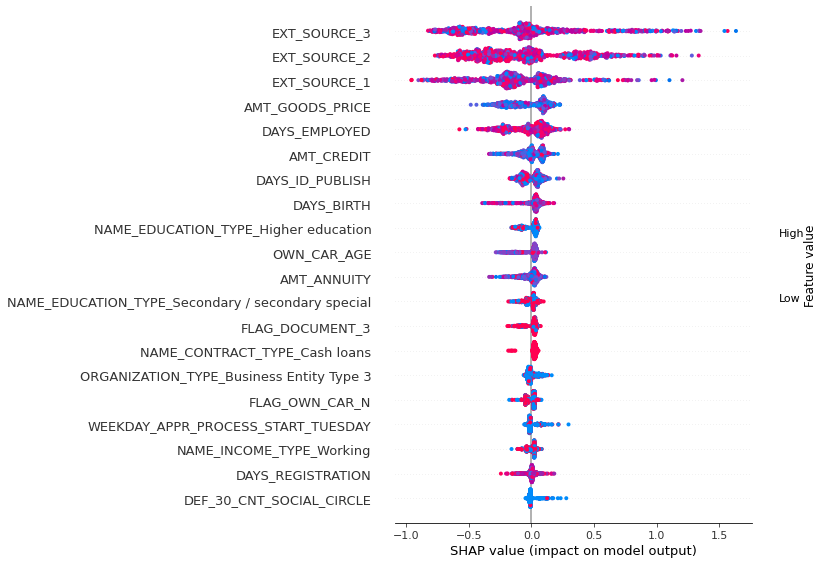

In [11]:
shap.summary_plot(shap_values[:1000], test.sample(1000))